# Clustering


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore')

from sklearn.cluster import KMeans

from scipy.stats import norm

from sklearn.svm import LinearSVC

from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix




In [2]:
colunas_gerais = [ 'TP_ESCOLA', 'NU_NOTA_CN', 'NU_NOTA_CH', 'NU_NOTA_LC', 'NU_NOTA_MT','NU_NOTA_REDACAO',
                  "TP_PRESENCA_CN", "TP_PRESENCA_CH", "TP_PRESENCA_LC", "TP_PRESENCA_MT", "IN_TREINEIRO"
                  ]

dados_gerais =  pd.read_csv(
        'MICRODADOS_ENEM_2023.csv',
        encoding = 'latin1',
        usecols = colunas_gerais,
        sep = ';'
    ) # .dropna()

In [3]:
# Treineros 1-sim, 0-Não
dados_gerais["IN_TREINEIRO"].value_counts()

IN_TREINEIRO
0    3313888
1     620067
Name: count, dtype: int64

In [4]:
dados_gerais = dados_gerais.loc[dados_gerais["IN_TREINEIRO"]==0]

In [5]:
dados_gerais.shape

(3313888, 11)

In [6]:
dados_gerais.isnull().sum()

TP_ESCOLA                0
IN_TREINEIRO             0
TP_PRESENCA_CN           0
TP_PRESENCA_CH           0
TP_PRESENCA_LC           0
TP_PRESENCA_MT           0
NU_NOTA_CN         1138381
NU_NOTA_CH         1039494
NU_NOTA_LC         1039494
NU_NOTA_MT         1138381
NU_NOTA_REDACAO    1039494
dtype: int64

In [7]:
dados_gerais.loc[dados_gerais["TP_ESCOLA"]==2].shape

(1166540, 11)

In [8]:
dados_gerais.loc[dados_gerais["TP_ESCOLA"]==2].isnull().sum()

TP_ESCOLA               0
IN_TREINEIRO            0
TP_PRESENCA_CN          0
TP_PRESENCA_CH          0
TP_PRESENCA_LC          0
TP_PRESENCA_MT          0
NU_NOTA_CN         333101
NU_NOTA_CH         291703
NU_NOTA_LC         291703
NU_NOTA_MT         333101
NU_NOTA_REDACAO    291703
dtype: int64

In [9]:
dados_gerais.loc[dados_gerais["TP_ESCOLA"]==3].shape

(234619, 11)

In [10]:
dados_gerais.loc[dados_gerais["TP_ESCOLA"]==3].isnull().sum()

TP_ESCOLA              0
IN_TREINEIRO           0
TP_PRESENCA_CN         0
TP_PRESENCA_CH         0
TP_PRESENCA_LC         0
TP_PRESENCA_MT         0
NU_NOTA_CN         12914
NU_NOTA_CH          9844
NU_NOTA_LC          9844
NU_NOTA_MT         12914
NU_NOTA_REDACAO     9844
dtype: int64

In [11]:
dados_gerais.isnull().sum()

TP_ESCOLA                0
IN_TREINEIRO             0
TP_PRESENCA_CN           0
TP_PRESENCA_CH           0
TP_PRESENCA_LC           0
TP_PRESENCA_MT           0
NU_NOTA_CN         1138381
NU_NOTA_CH         1039494
NU_NOTA_LC         1039494
NU_NOTA_MT         1138381
NU_NOTA_REDACAO    1039494
dtype: int64

In [12]:
dados_gerais.dropna(inplace=True)

In [13]:
dados_gerais.shape

(2166843, 11)

Consideramos a presença informada em cada uma das provas objetivas

In [14]:
dados_gerais.loc[(dados_gerais["TP_PRESENCA_CN"]==1) & (dados_gerais["TP_PRESENCA_CH"]==1) & (dados_gerais["TP_PRESENCA_LC"]==1)
                 & (dados_gerais["TP_PRESENCA_MT"]==1) ].shape

(2166843, 11)

In [15]:
# Separando os estudantes que informaram o tipo de escola
dados_escolas_Pub_Pri = dados_gerais.loc[ (dados_gerais["TP_ESCOLA"]==2) | (dados_gerais["TP_ESCOLA"]==3) ].copy()

In [16]:
dados_escolas_Pub_Pri.shape

(1050858, 11)

In [17]:
features = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO"]
target = ["TP_ESCOLA"]
features_target = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO", "TP_ESCOLA"]


dados_notas = dados_escolas_Pub_Pri[features].copy()
dados_tipoEscola = dados_escolas_Pub_Pri[target].copy()
dados_notas_escola = dados_escolas_Pub_Pri[features_target].copy()

In [18]:
for materia in features:
    print(f"Zeros em  {materia}:" , dados_notas_escola.loc[dados_notas_escola[materia]==0].shape[0])

Zeros em  NU_NOTA_CN: 5449
Zeros em  NU_NOTA_CH: 1290
Zeros em  NU_NOTA_LC: 332
Zeros em  NU_NOTA_MT: 5486
Zeros em  NU_NOTA_REDACAO: 42801


In [19]:
for materia in features:
    print(f"Zeros em  {materia}:" , dados_notas_escola.loc[(dados_notas_escola[materia]==0) & 
                                                           (dados_notas_escola["TP_ESCOLA"]==2) ].shape[0])

Zeros em  NU_NOTA_CN: 5060
Zeros em  NU_NOTA_CH: 1163
Zeros em  NU_NOTA_LC: 298
Zeros em  NU_NOTA_MT: 5102
Zeros em  NU_NOTA_REDACAO: 41156


In [20]:
for materia in features:
    print(f"Zeros em  {materia}:" , dados_notas_escola.loc[(dados_notas_escola[materia]==0) & (dados_notas_escola["TP_ESCOLA"]==3
                                                                                               ) ].shape[0])

Zeros em  NU_NOTA_CN: 389
Zeros em  NU_NOTA_CH: 127
Zeros em  NU_NOTA_LC: 34
Zeros em  NU_NOTA_MT: 384
Zeros em  NU_NOTA_REDACAO: 1645


### pairplot

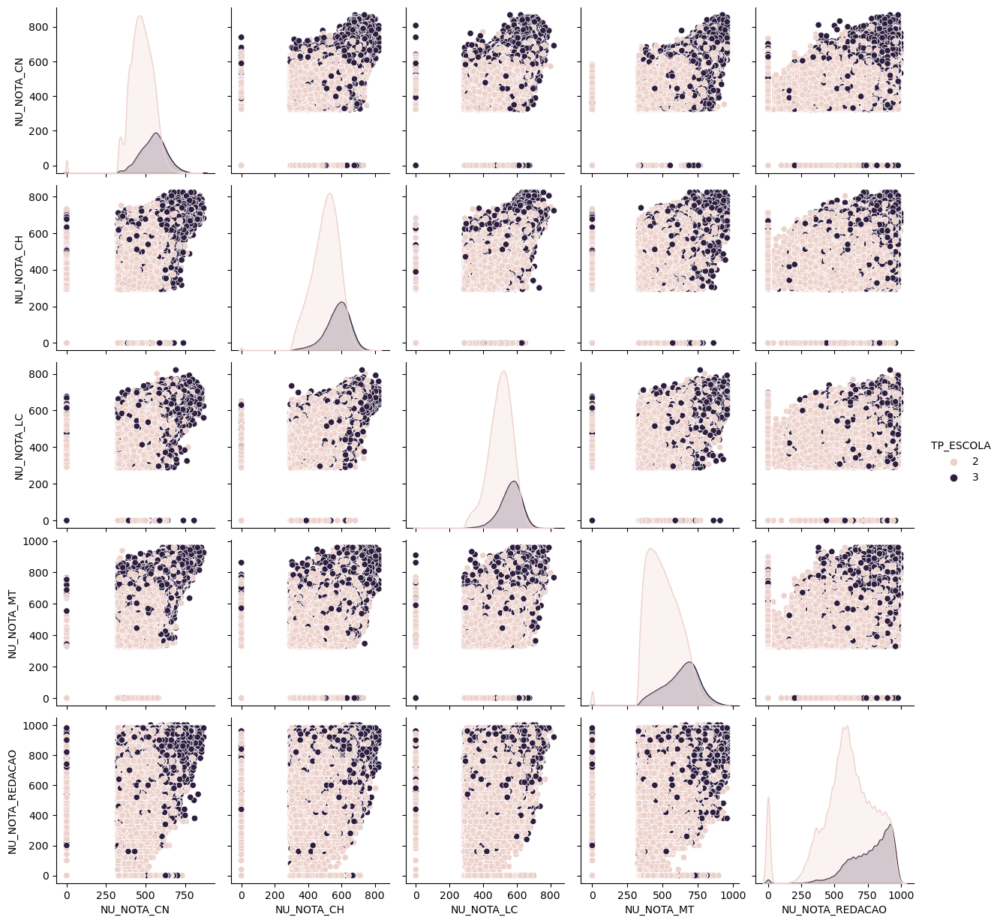

In [21]:
sns.pairplot(dados_notas_escola, hue = 'TP_ESCOLA')

plt.show()

### Sem zeros


Dado que temos uma quantidade considerável de estudantes com nota zero em algumas provas e não conhecemos o real motivo dessas notas, decidimos desconsiderá-los para o treinamento dos nossos modelos.

In [22]:
# features = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO"]

dados_notas_escola_0 = dados_notas_escola.loc[(dados_notas_escola["NU_NOTA_CN"] != 0) 
                                              & (dados_notas_escola["NU_NOTA_CH"] != 0) 
                                               & (dados_notas_escola["NU_NOTA_LC"] != 0) 
                                                  & (dados_notas_escola["NU_NOTA_MT"] != 0) 
                                                     & (dados_notas_escola["NU_NOTA_REDACAO"] != 0) ].copy()

In [23]:
dados_notas_escola_0.shape

(1002841, 6)

In [24]:
dados_notas_escola_0.loc[dados_notas_escola_0["TP_ESCOLA"] == 2].shape

(783634, 6)

In [25]:
dados_notas_escola_0.loc[dados_notas_escola_0["TP_ESCOLA"] == 3].shape

(219207, 6)

In [26]:
dados_notas_escola_0["Media_Notas"] = dados_notas_escola_0[['NU_NOTA_CN', 'NU_NOTA_CH',
                                                             'NU_NOTA_LC', 'NU_NOTA_MT', 'NU_NOTA_REDACAO']].mean(axis=1)

In [27]:
dados_notas_escola_0["Media_Notas"].describe()

count    1.002841e+06
mean     5.463257e+02
std      8.657186e+01
min      2.691600e+02
25%      4.820000e+02
50%      5.426400e+02
75%      6.076400e+02
max      8.625800e+02
Name: Media_Notas, dtype: float64

In [28]:
# features = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO"]
# target = ["TP_ESCOLA"]
# features_target = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO", "TP_ESCOLA"]


dados_notas_0 = dados_notas_escola_0[features].copy()
dados_tipoEscola_0 = dados_notas_escola_0[target].copy()

#### pairplot sem zeros

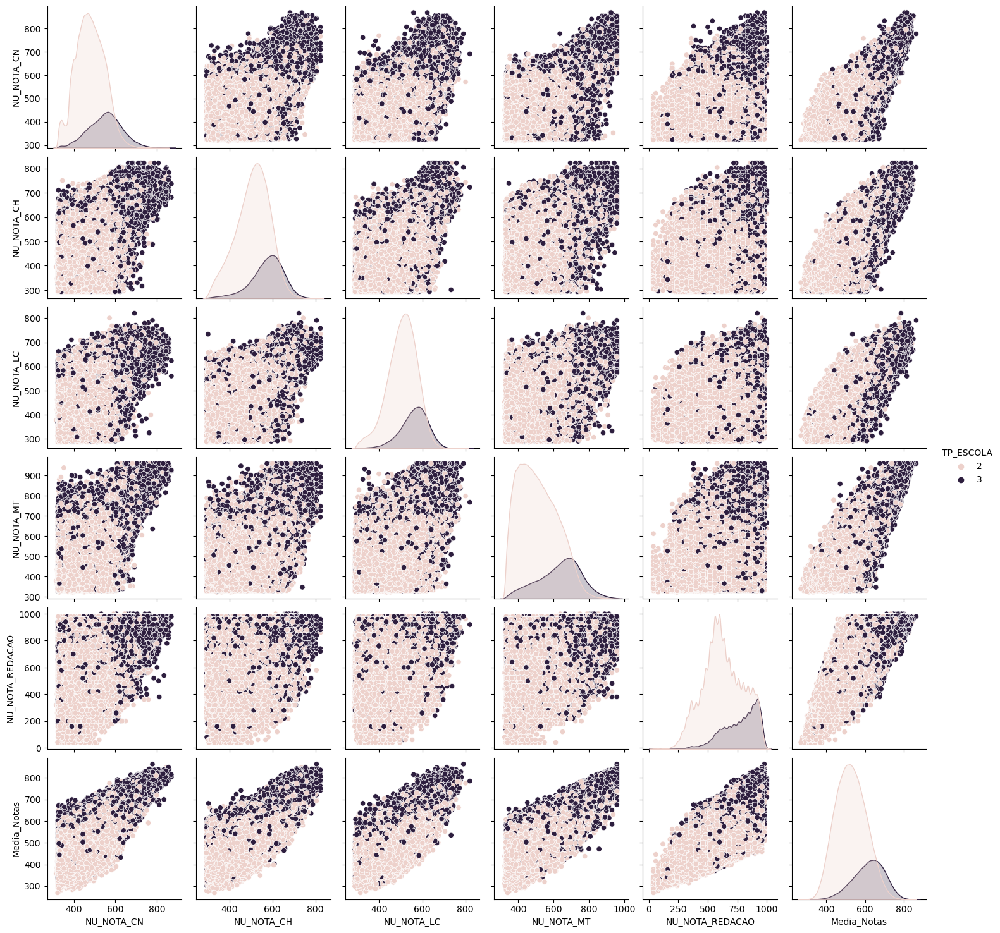

In [29]:
sns.pairplot(dados_notas_escola_0, hue = 'TP_ESCOLA')

plt.show()

### Escalomanemto


In [30]:
from sklearn.preprocessing import StandardScaler # type: ignore
scaler = StandardScaler()


In [31]:
dados_notas_escaldo = dados_notas_0.copy()

dados_notas_escaldo = scaler.fit_transform(dados_notas_escaldo)

In [32]:
dados_notas_escaldo = pd.DataFrame(dados_notas_escaldo)

In [33]:
dados_notas_escaldo.describe()

,0,1,2,3,4
count,1.002841e+06,1.002841e+06,1.002841e+06,1.002841e+06,1.002841e+06
mean,-2.312415e-15,1.233862e-15,1.311630e-15,-2.254372e-15,1.587107e-17
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-2.323080e+00,-2.810159e+00,-3.256228e+00,-1.755541e+00,-3.536883e+00
25%,-7.247448e-01,-6.494627e-01,-6.324170e-01,-8.287488e-01,-6.739662e-01
50%,-5.258433e-02,7.117725e-02,6.398323e-02,-8.910539e-02,-1.013827e-01
75%,6.781948e-01,7.086194e-01,6.998881e-01,7.514355e-01,8.147508e-01
max,4.871382e+00,3.668260e+00,4.253639e+00,3.423591e+00,1.959918e+00


### SVM

In [34]:


X_train, X_test, y_train, y_test = train_test_split(
    dados_notas_escaldo, dados_tipoEscola_0, test_size=0.3, random_state=42, stratify=dados_tipoEscola_0
)

In [35]:
# Instanciamos o classificador SVM

modelo_svm = LinearSVC(class_weight="balanced", max_iter=3000, random_state=42, tol=5e-4)



In [36]:
modelo_svm.fit(X_train, y_train)


LinearSVC(class_weight='balanced', max_iter=3000, random_state=42, tol=0.0005)

In [37]:
y_pre = modelo_svm.predict(X_test)

In [38]:
from sklearn import metrics
print(f'Acurácia: {metrics.accuracy_score(y_test, y_pre)}')
print(f'F1-score médio: {metrics.f1_score(y_test, y_pre, average="weighted")}')
print(f"F1-score da classe minoritária: {metrics.f1_score(y_test, y_pre, pos_label=3)}")



Acurácia: 0.7282559921290465
F1-score médio: 0.7486412429326749
F1-score da classe minoritária: 0.5384072495271435


Podemos ver que ainda que o modelo apresente uma acurácia medianamente boa para nosso objetivo, temos erros a considerar na classe minoritária.

In [39]:
conf_matrix = confusion_matrix(y_test, modelo_svm.predict(X_test))
conf_matrix

array([[171418,  63673],
       [ 18082,  47680]], dtype=int64)

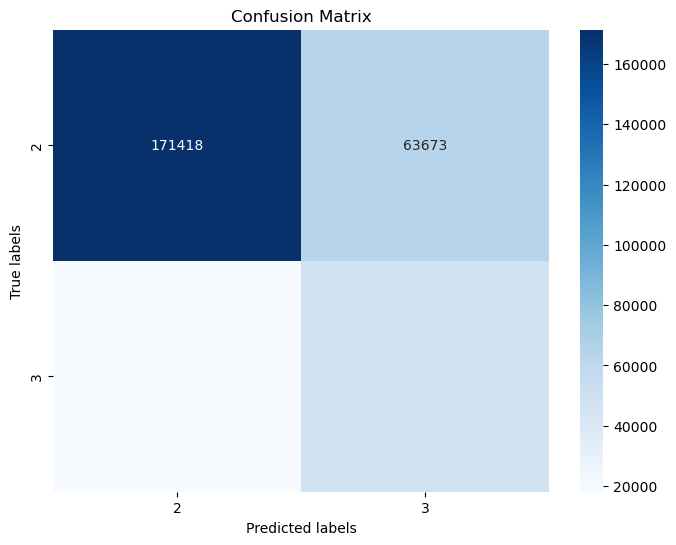

In [40]:
conf_matrix = confusion_matrix(y_test, modelo_svm.predict(X_test))


labels = sorted(modelo_svm.classes_)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


### K-means

Consideramos agora um modelo não supervisionado.

Nosso objetivo é ver se é possivel separar de forma geral os estudantes de escolas públicas e privadas, a partir de seus resultados nas provas.

In [41]:
dt = pd.DataFrame(dados_notas_escaldo)
dt

,0,1,2,3,4
0,-0.461612,-0.179640,-0.158302,-0.578946,1.272818
1,-1.197602,-1.761622,-1.006644,-1.623723,-0.559450
2,1.481922,1.766945,1.258415,1.253482,0.700234
3,0.276983,0.366040,0.365053,-0.820612,1.272818
4,0.382496,0.649892,1.098032,0.734348,-0.330416
...,...,...,...,...,...
1002836,1.181013,-1.047099,1.161341,0.137100,-1.933650
1002837,1.384224,1.076892,2.013904,1.044364,0.585717
1002838,-0.657008,-0.144158,-0.051380,-0.756330,-0.330416
1002839,-0.237559,0.241243,0.376308,-0.059813,-0.330416


In [42]:
wcss = []
for i in range(1,16):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 5, max_iter = 300)
    kmeans.fit(dt)
# Método inertia para gerar o wcss
    wcss.append(kmeans.inertia_)

  File "c:\Users\jonat\miniconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


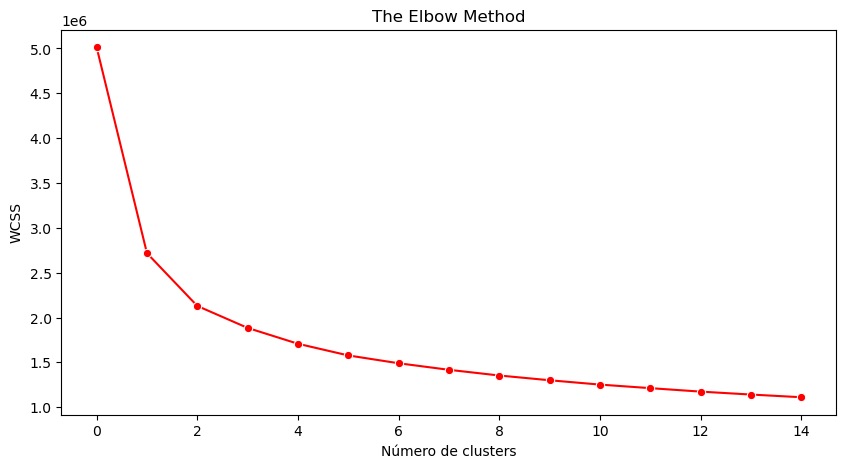

In [43]:
plt.figure(figsize=(10,5))
sns.lineplot(wcss,marker='o',color='red')
plt.title('The Elbow Method')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS');

Considerando a natureza do nosso problema, inicialmente consideramos treinar um modelo com 2 clusters. 

Também iremos considerar o caso k = 4. 

#### Kmeans k=2

In [44]:
kmeans_k2 = KMeans(n_clusters = 2, init = 'k-means++', random_state = 5, max_iter = 300)


In [45]:
kmeans_k2.fit(dt)

KMeans(n_clusters=2, random_state=5)

In [46]:
agrupamento2 = pd.DataFrame(kmeans_k2.labels_, columns = ['Grupo'])

In [47]:
dados_tipoEscola_reset = dados_tipoEscola_0.reset_index(drop=True)
agrupamento2_reset = agrupamento2.reset_index(drop=True)

df_tipoEscola_Grupo = pd.concat([dados_tipoEscola_reset, agrupamento2_reset],axis=1)

In [48]:
df_tipoEscola_Grupo

,TP_ESCOLA,Grupo
0,2,1
1,2,1
2,2,0
3,2,0
4,2,0
...,...,...
1002836,2,1
1002837,2,0
1002838,3,1
1002839,2,1


In [49]:
# Consideramos a distribuição dos estudantes de escolas públicas nos grupos gerados pelo K-means com k=2.

df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["TP_ESCOLA"]==2].value_counts()

TP_ESCOLA  Grupo
2          1        497217
           0        286417
Name: count, dtype: int64

In [50]:
# Consideramos a distribuição dos estudantes de escolas privadas nos grupos gerados pelo K-means com k=2.

df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["TP_ESCOLA"]==3].value_counts()

TP_ESCOLA  Grupo
3          0        172395
           1         46812
Name: count, dtype: int64

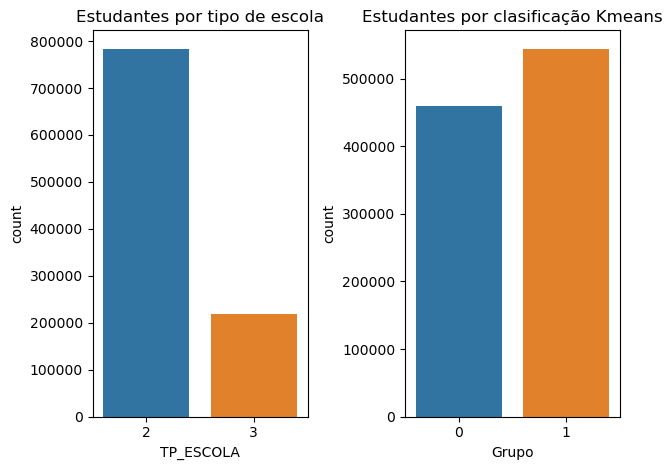

In [51]:
plt.subplot(1, 2, 1)
sns.countplot(x=df_tipoEscola_Grupo['TP_ESCOLA'])
plt.title('Estudantes por tipo de escola')

plt.subplot(1, 2, 2)
sns.countplot(x=df_tipoEscola_Grupo['Grupo'])
plt.title('Estudantes por clasificação Kmeans')

plt.tight_layout()
plt.show()




In [52]:
contingency_table = pd.crosstab(df_tipoEscola_Grupo['TP_ESCOLA'], df_tipoEscola_Grupo['Grupo'])


print(contingency_table)


Grupo           0       1
TP_ESCOLA                
2          286417  497217
3          172395   46812


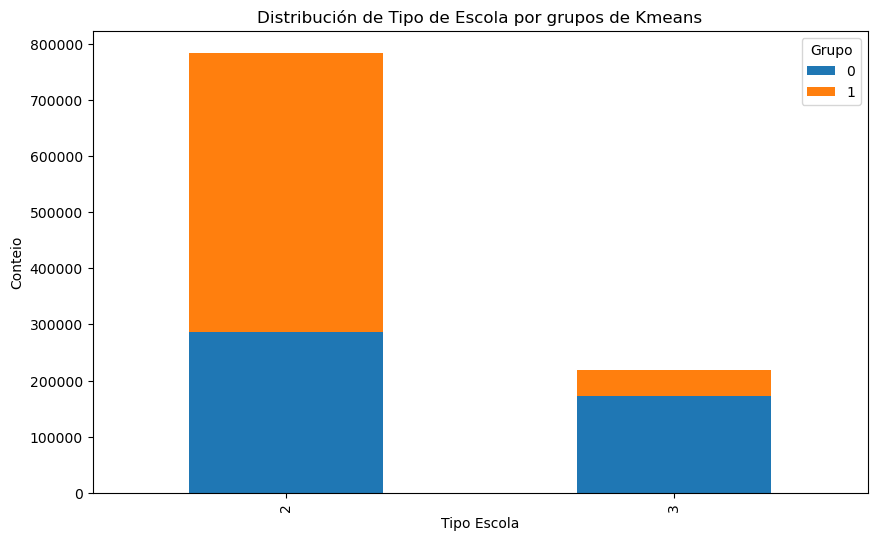

In [53]:
contingency_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución de Tipo de Escola por grupos de Kmeans')
plt.xlabel('Tipo Escola')
plt.ylabel('Conteio')
plt.legend(title='Grupo')
plt.show()



In [54]:

contingency_table2 = pd.crosstab(df_tipoEscola_Grupo['Grupo'], df_tipoEscola_Grupo['TP_ESCOLA'])


print(contingency_table2)


TP_ESCOLA       2       3
Grupo                    
0          286417  172395
1          497217   46812


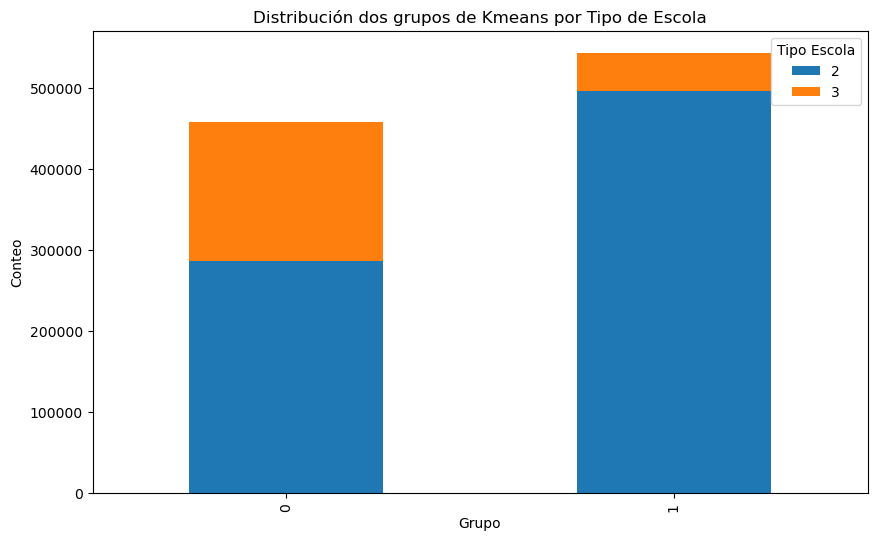

In [55]:
contingency_table2.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución dos grupos de Kmeans por Tipo de Escola')
plt.xlabel('Grupo')
plt.ylabel('Conteo')
plt.legend(title='Tipo Escola')
plt.show()

In [56]:
dados_notas_reset = dados_notas_0.reset_index(drop=True)
agrupamento2_reset = agrupamento2.reset_index(drop=True)

df_notas_Grupo = pd.concat([dados_notas_reset, agrupamento2_reset],axis=1)

In [57]:
df_notas_Grupo

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Grupo
0,459.0,508.5,507.2,466.7,880.0,1
1,402.5,379.2,446.9,338.3,560.0,1
2,608.2,667.6,607.9,691.9,780.0,0
3,515.7,553.1,544.4,437.0,880.0,0
4,523.8,576.3,596.5,628.1,600.0,0
...,...,...,...,...,...,...
1002836,585.1,437.6,601.0,554.7,320.0,1
1002837,600.7,611.2,661.6,666.2,760.0,0
1002838,444.0,511.4,514.8,444.9,600.0,1
1002839,476.2,542.9,545.2,530.5,600.0,1


A continuação, apresentamos os resultados das provas distribuídos nos grupos obtidos no modelo.

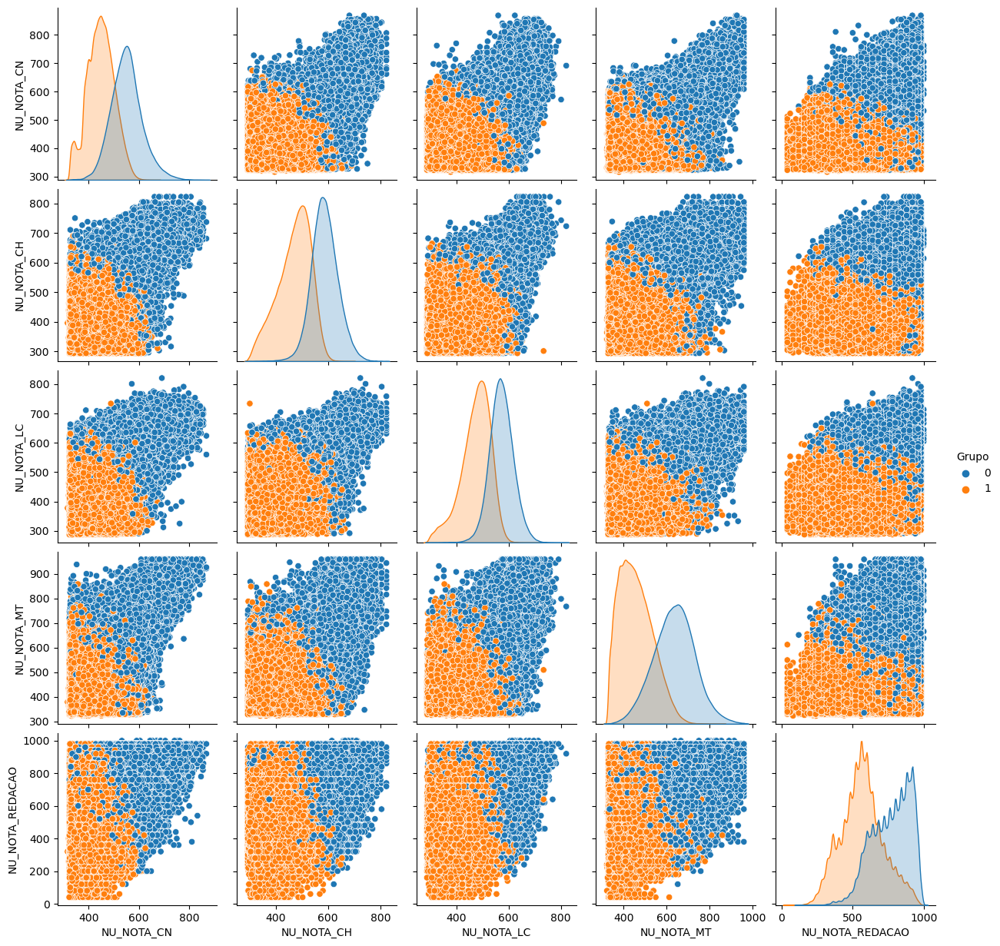

In [58]:
sns.pairplot(df_notas_Grupo, hue = 'Grupo')

plt.show()

#### KMeans k=4

In [59]:
kmeans_k4 = KMeans(n_clusters = 4, init = 'k-means++', random_state = 5, max_iter = 300)


In [60]:
kmeans_k4.fit(dt)

KMeans(n_clusters=4, random_state=5)

In [61]:
agrupamento4 = pd.DataFrame(kmeans_k4.labels_, columns = ['Grupo'])

In [62]:
dados_tipoEscola_reset = dados_tipoEscola_0.reset_index(drop=True)
agrupamento4_reset = agrupamento4.reset_index(drop=True)

df_tipoEscola_Grupo = pd.concat([dados_tipoEscola_reset, agrupamento4_reset],axis=1)

In [63]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["TP_ESCOLA"]==2].value_counts()

TP_ESCOLA  Grupo
2          2        299128
           0        225302
           1        196473
           3         62731
Name: count, dtype: int64

In [64]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["TP_ESCOLA"]==3].value_counts()

TP_ESCOLA  Grupo
3          3        92733
           0        80584
           2        35711
           1        10179
Name: count, dtype: int64

In [65]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["Grupo"]==0].value_counts()

TP_ESCOLA  Grupo
2          0        225302
3          0         80584
Name: count, dtype: int64

In [66]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["Grupo"]==1].value_counts()

TP_ESCOLA  Grupo
2          1        196473
3          1         10179
Name: count, dtype: int64

In [67]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["Grupo"]==2].value_counts()

TP_ESCOLA  Grupo
2          2        299128
3          2         35711
Name: count, dtype: int64

In [68]:
df_tipoEscola_Grupo.loc[df_tipoEscola_Grupo["Grupo"]==3].value_counts()

TP_ESCOLA  Grupo
3          3        92733
2          3        62731
Name: count, dtype: int64

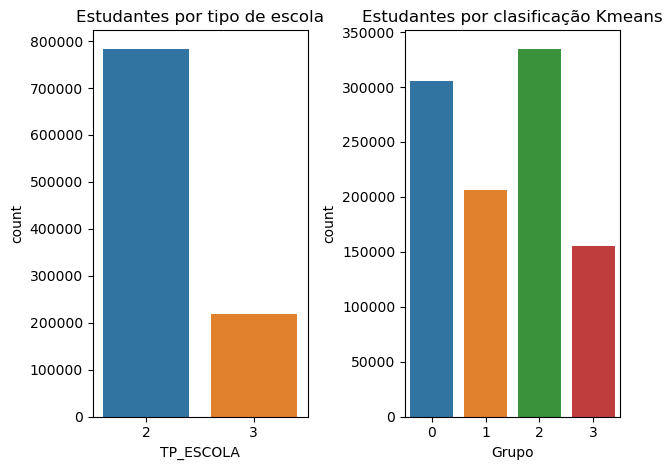

In [69]:
plt.subplot(1, 2, 1)
sns.countplot(x=df_tipoEscola_Grupo['TP_ESCOLA'])
plt.title('Estudantes por tipo de escola')

plt.subplot(1, 2, 2)
sns.countplot(x=df_tipoEscola_Grupo['Grupo'])
plt.title('Estudantes por clasificação Kmeans')

plt.tight_layout()
plt.show()




In [70]:

contingency_table = pd.crosstab(df_tipoEscola_Grupo['TP_ESCOLA'], df_tipoEscola_Grupo['Grupo'])

print(contingency_table)

Grupo           0       1       2      3
TP_ESCOLA                               
2          225302  196473  299128  62731
3           80584   10179   35711  92733


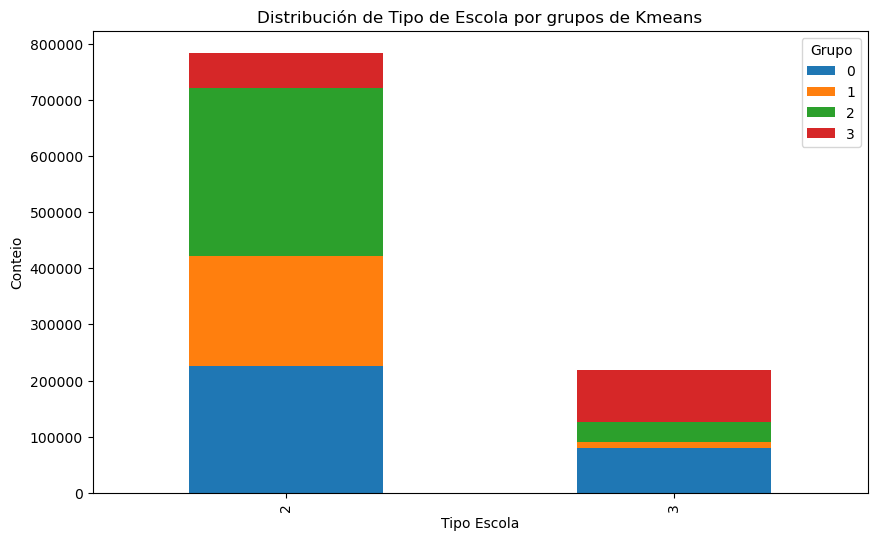

In [71]:

contingency_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución de Tipo de Escola por grupos de Kmeans')
plt.xlabel('Tipo Escola')
plt.ylabel('Conteio')
plt.legend(title='Grupo')
plt.show()



In [72]:

contingency_table2 = pd.crosstab(df_tipoEscola_Grupo['Grupo'], df_tipoEscola_Grupo['TP_ESCOLA'])


print(contingency_table2)


TP_ESCOLA       2      3
Grupo                   
0          225302  80584
1          196473  10179
2          299128  35711
3           62731  92733


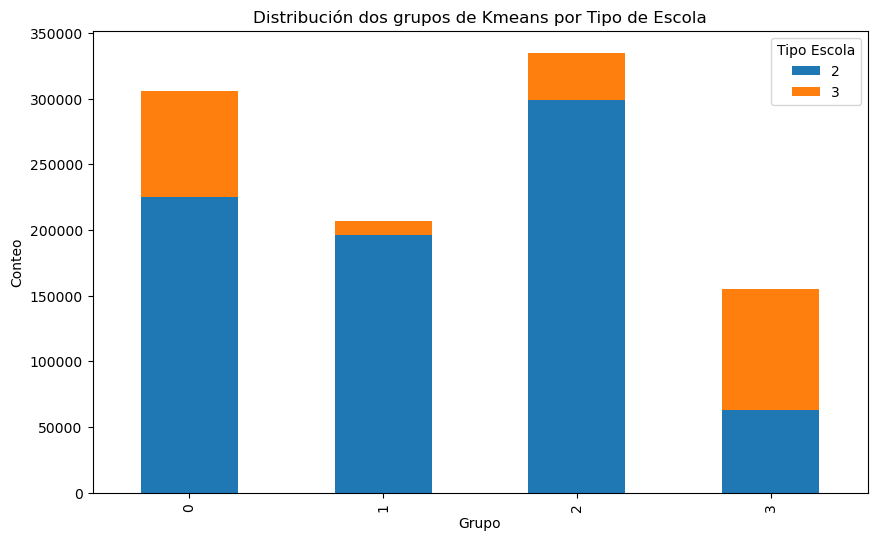

In [73]:

contingency_table2.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución dos grupos de Kmeans por Tipo de Escola')
plt.xlabel('Grupo')
plt.ylabel('Conteo')
plt.legend(title='Tipo Escola')
plt.show()


In [74]:
dados_notas_reset = dados_notas_0.reset_index(drop=True)
agrupamento4_reset = agrupamento4.reset_index(drop=True)

df_notas_Grupo = pd.concat([dados_notas_reset, agrupamento4_reset],axis=1)

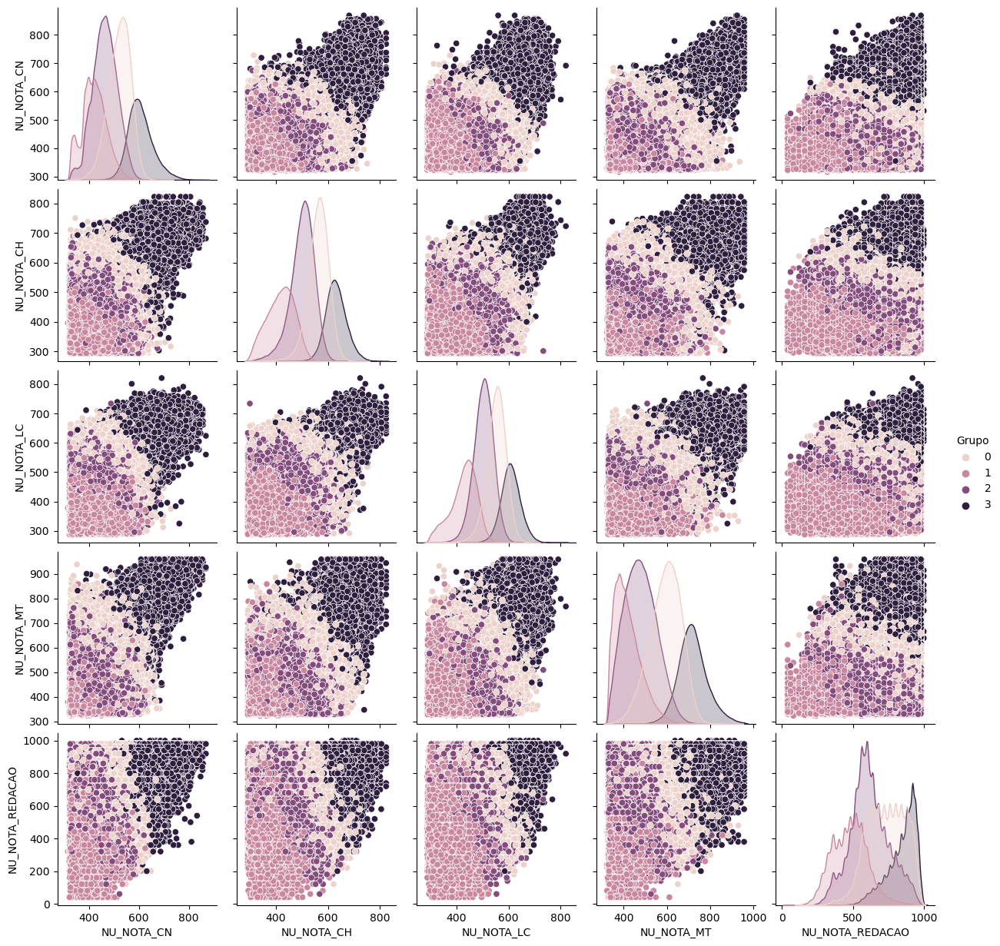

In [76]:
sns.pairplot(df_notas_Grupo, hue = 'Grupo')

plt.show()

## Amostra


Consideraremos agora trabalhar com uma amostra dos dados, tomando como parâmetro a média das notas das provas objetivas.
Consideramos um intervalo de confiança de 95% com um erro de 2%.

Após a amostragem, consideraremos novamente o modelo K-means, classificando em 2 e 4 grupos, como no caso acima.

In [77]:


# Parâmetros
desvpad =  86.57186     # desvio padrão
e =  542.6400*0.02            # erro inferencial
N = 1002841        # Tamanho da população
conf = 0.95       # nível de confiança
alpha = 1 - conf  # nível de significância

# Cálculo do Z-score
z = norm.ppf(conf + alpha/2)

# Cálculo do tamanho da amostra
n = (N * (z * desvpad)**2)/(((N - 1) * e**2) + (z * desvpad)**2)

# Valor da amostra
print("Tamanho da amostra será: ", np.round(n, 0))

Tamanho da amostra será:  244.0


In [78]:
data = pd.DataFrame(dados_notas_escola_0)
data

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,TP_ESCOLA,Media_Notas
3,459.0,508.5,507.2,466.7,880.0,2,564.28
4,402.5,379.2,446.9,338.3,560.0,2,425.38
11,608.2,667.6,607.9,691.9,780.0,2,671.12
16,515.7,553.1,544.4,437.0,880.0,2,586.04
41,523.8,576.3,596.5,628.1,600.0,2,584.94
...,...,...,...,...,...,...,...
3933921,585.1,437.6,601.0,554.7,320.0,2,499.68
3933940,600.7,611.2,661.6,666.2,760.0,2,659.94
3933944,444.0,511.4,514.8,444.9,600.0,3,503.02
3933948,476.2,542.9,545.2,530.5,600.0,2,538.96


In [79]:
n_privada = np.round(244*0.22)
n_publica = np.round(244*0.78)

n_privada = int(n_privada)
n_publica = int(n_publica)


amostra_privada = (data.loc[data["TP_ESCOLA"] == 3]).sample(n=n_privada, random_state=17)

amostra_publica = data.loc[data["TP_ESCOLA"] == 2].sample(n=n_publica, random_state=17)

amostra = pd.concat([amostra_privada,amostra_publica])

amostra = amostra.sample(frac=1, random_state=17).reset_index(drop=True)

In [80]:
amostra

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,TP_ESCOLA,Media_Notas
0,614.4,642.7,604.2,601.7,760.0,3,644.60
1,486.2,483.2,560.9,702.3,540.0,2,554.52
2,437.5,451.8,475.7,517.6,340.0,2,444.52
3,515.7,510.4,482.8,756.8,760.0,3,605.14
4,375.3,501.4,472.7,403.9,840.0,2,518.66
...,...,...,...,...,...,...,...
239,431.4,512.3,469.6,349.8,540.0,2,460.62
240,644.6,573.3,557.3,686.4,560.0,2,604.32
241,538.5,378.5,335.4,412.0,420.0,2,416.88
242,556.3,598.2,574.8,609.5,680.0,2,603.76


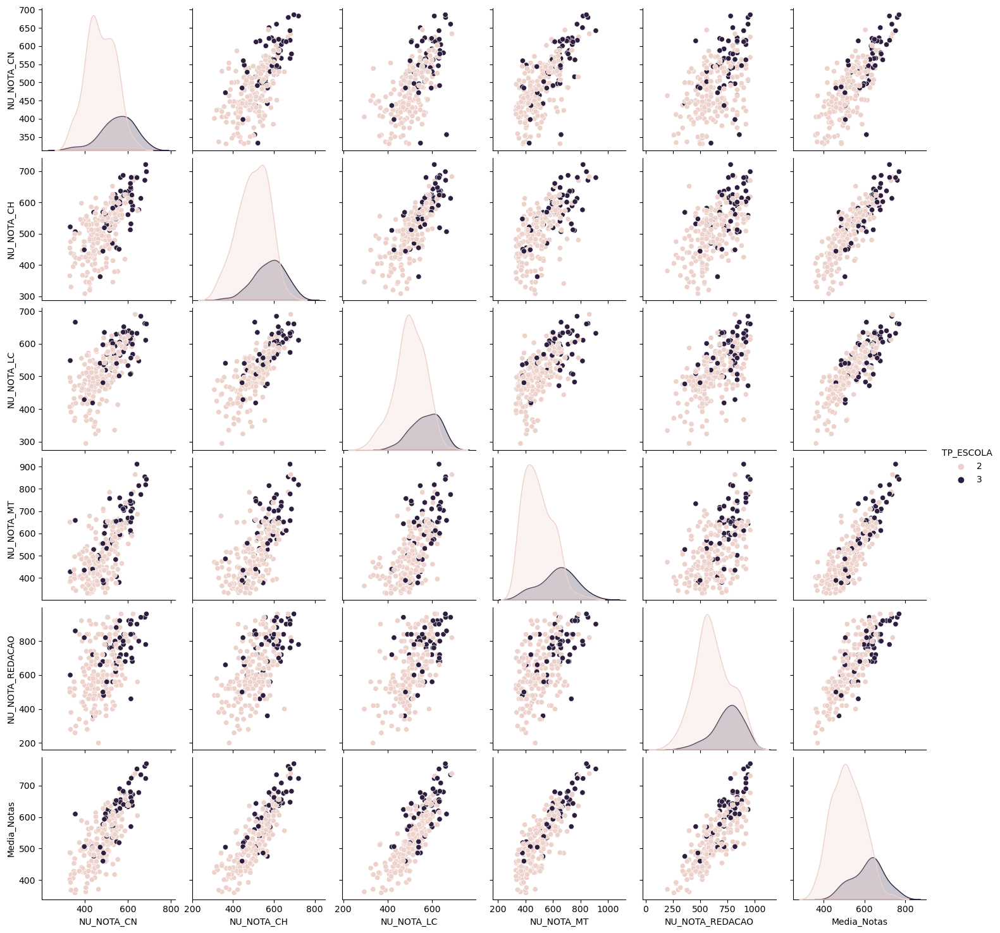

In [81]:
sns.pairplot(amostra, hue="TP_ESCOLA")

plt.show()

### Escalonamento amostra

In [82]:
from sklearn.preprocessing import StandardScaler # type: ignore
scaler = StandardScaler()

In [83]:
features = ["NU_NOTA_CN", "NU_NOTA_CH", "NU_NOTA_LC", "NU_NOTA_MT", "NU_NOTA_REDACAO", "Media_Notas"]
target = ["TP_ESCOLA"]

In [84]:
amostra_f = amostra[features].copy()

amostra_f_escalonada = scaler.fit_transform(amostra_f)

amostra_f_escalonada = pd.DataFrame(amostra_f_escalonada)

amostra_f_escalonada.describe()

,0,1,2,3,4,5
count,2.440000e+02,2.440000e+02,2.440000e+02,2.440000e+02,2.440000e+02,2.440000e+02
mean,-2.984862e-16,5.824121e-17,-8.080968e-16,2.912060e-17,-1.456030e-16,2.839259e-16
std,1.002056e+00,1.002056e+00,1.002056e+00,1.002056e+00,1.002056e+00,1.002056e+00
min,-2.095190e+00,-2.527811e+00,-3.025092e+00,-1.538401e+00,-2.710884e+00,-2.070277e+00
25%,-7.226669e-01,-6.864873e-01,-5.861794e-01,-8.157385e-01,-6.517836e-01,-6.929867e-01
50%,2.692536e-03,8.065464e-02,-1.920487e-02,-1.359034e-01,-4.616593e-02,-8.990109e-02
75%,6.917349e-01,6.971678e-01,7.037645e-01,7.318520e-01,8.016988e-01,7.491271e-01
max,2.554701e+00,2.488281e+00,2.376356e+00,3.106172e+00,1.891810e+00,2.654556e+00


### kmeans amostra

#### kmeans k=2

In [85]:
wcss = []
for i in range(1,16):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 5, max_iter = 300)
    kmeans.fit(amostra_f_escalonada)
# Método inertia para gerar o wcss
    wcss.append(kmeans.inertia_)

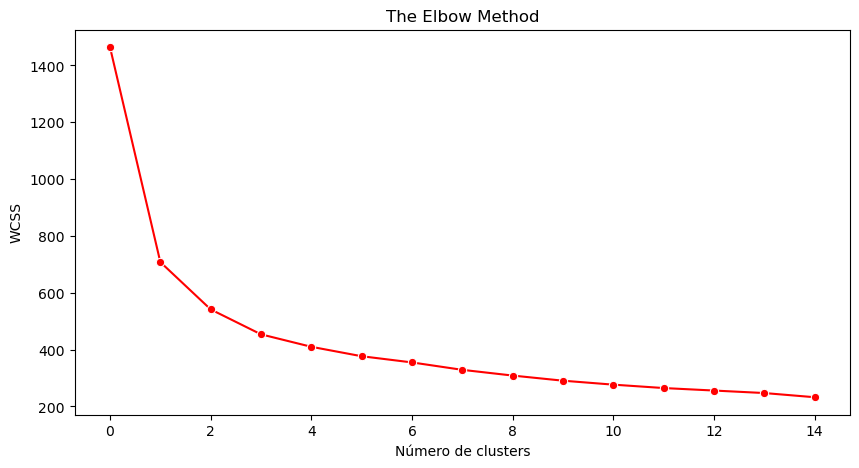

In [86]:
plt.figure(figsize=(10,5))
sns.lineplot(wcss,marker='o',color='red')
plt.title('The Elbow Method')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS');

Novamente consideraremos os casos k=2 e k=4. 

In [87]:
kmeans_k2 = KMeans(n_clusters = 2, init = 'k-means++', random_state = 5, max_iter = 300)

In [88]:
kmeans_k2.fit(amostra_f_escalonada)

KMeans(n_clusters=2, random_state=5)

In [89]:
agrupamento2 = pd.DataFrame(kmeans_k2.labels_, columns = ['Grupo'])

In [90]:
amostra_tipoEscola_Grupo = pd.concat([amostra["TP_ESCOLA"], agrupamento2],axis=1)
amostra_tipoEscola_Grupo

,TP_ESCOLA,Grupo
0,3,1
1,2,1
2,2,0
3,3,1
4,2,0
...,...,...
239,2,0
240,2,1
241,2,0
242,2,1


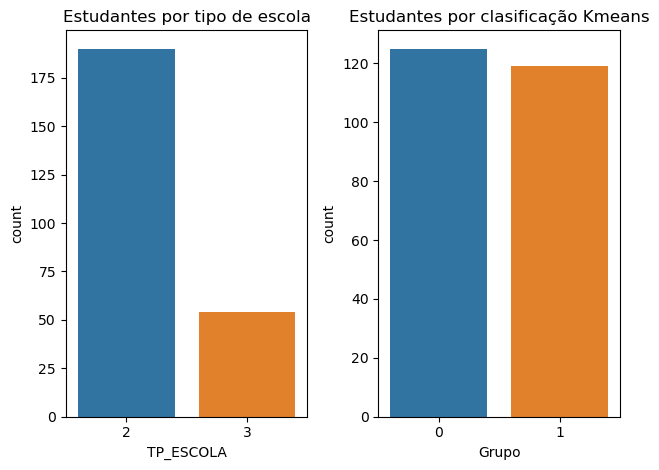

In [91]:
plt.subplot(1, 2, 1)
sns.countplot(x=amostra_tipoEscola_Grupo['TP_ESCOLA'])
plt.title('Estudantes por tipo de escola')

plt.subplot(1, 2, 2)
sns.countplot(x=amostra_tipoEscola_Grupo['Grupo'])
plt.title('Estudantes por clasificação Kmeans')

plt.tight_layout()
plt.show()

In [92]:
amostra_tipoEscola_Grupo = pd.concat([amostra["TP_ESCOLA"], agrupamento2],axis=1)


contingency_table = pd.crosstab(amostra_tipoEscola_Grupo['TP_ESCOLA'], amostra_tipoEscola_Grupo['Grupo'])


print(contingency_table)

Grupo        0   1
TP_ESCOLA         
2          115  75
3           10  44


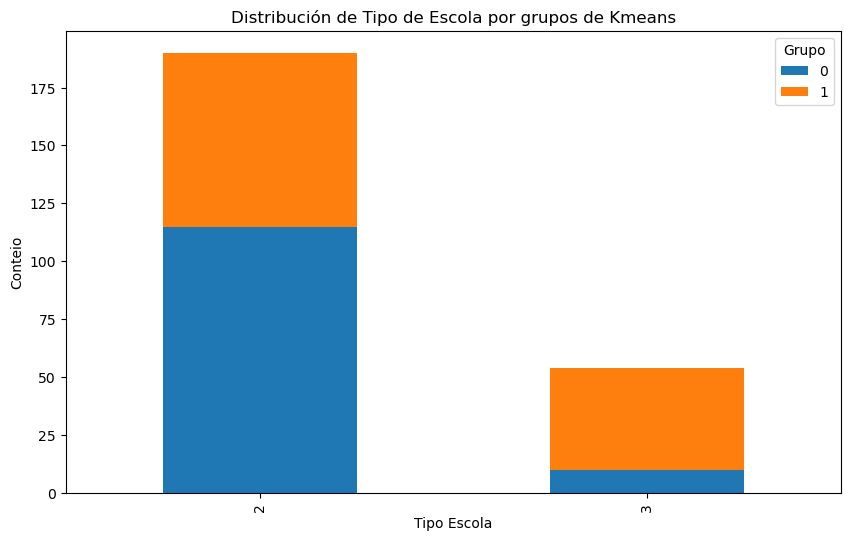

In [93]:
contingency_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución de Tipo de Escola por grupos de Kmeans')
plt.xlabel('Tipo Escola')
plt.ylabel('Conteio')
plt.legend(title='Grupo')
plt.show()

In [94]:
contingency_table2 = pd.crosstab(amostra_tipoEscola_Grupo['Grupo'], amostra_tipoEscola_Grupo['TP_ESCOLA'])


print(contingency_table)

Grupo        0   1
TP_ESCOLA         
2          115  75
3           10  44


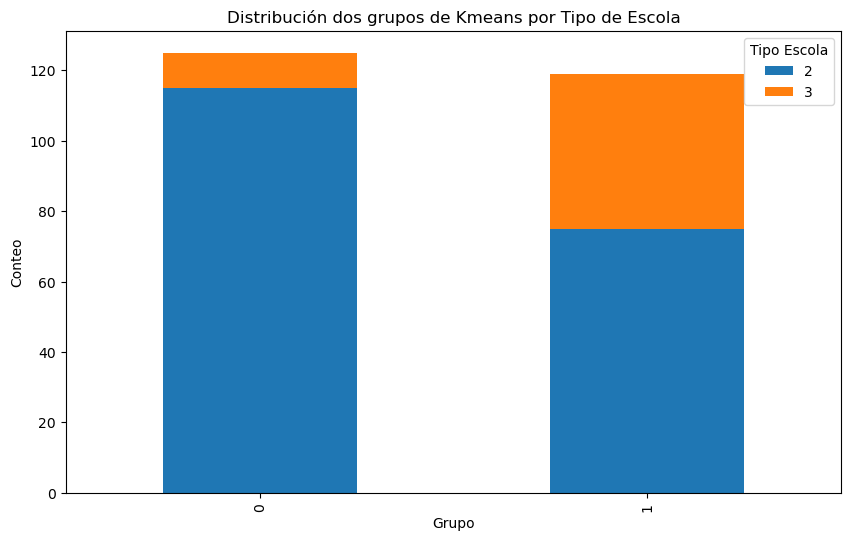

In [95]:
contingency_table2.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribución dos grupos de Kmeans por Tipo de Escola')
plt.xlabel('Grupo')
plt.ylabel('Conteo')
plt.legend(title='Tipo Escola')
plt.show()

In [96]:
amostra_kmeans = pd.concat([amostra_f, agrupamento2],axis=1)

In [97]:
amostra_kmeans

,NU_NOTA_CN,NU_NOTA_CH,NU_NOTA_LC,NU_NOTA_MT,NU_NOTA_REDACAO,Media_Notas,Grupo
0,614.4,642.7,604.2,601.7,760.0,644.60,1
1,486.2,483.2,560.9,702.3,540.0,554.52,1
2,437.5,451.8,475.7,517.6,340.0,444.52,0
3,515.7,510.4,482.8,756.8,760.0,605.14,1
4,375.3,501.4,472.7,403.9,840.0,518.66,0
...,...,...,...,...,...,...,...
239,431.4,512.3,469.6,349.8,540.0,460.62,0
240,644.6,573.3,557.3,686.4,560.0,604.32,1
241,538.5,378.5,335.4,412.0,420.0,416.88,0
242,556.3,598.2,574.8,609.5,680.0,603.76,1


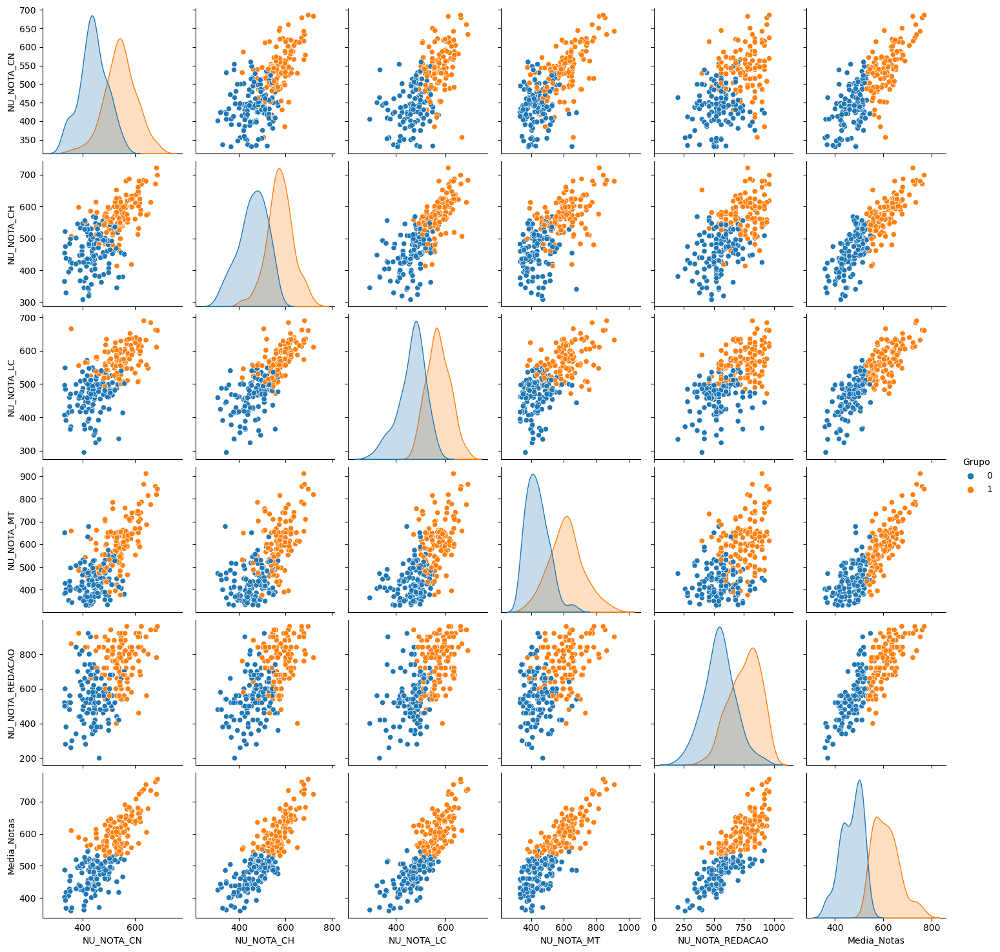

In [98]:
sns.pairplot(amostra_kmeans, hue = 'Grupo')

plt.show()

#### Kmeans k=4

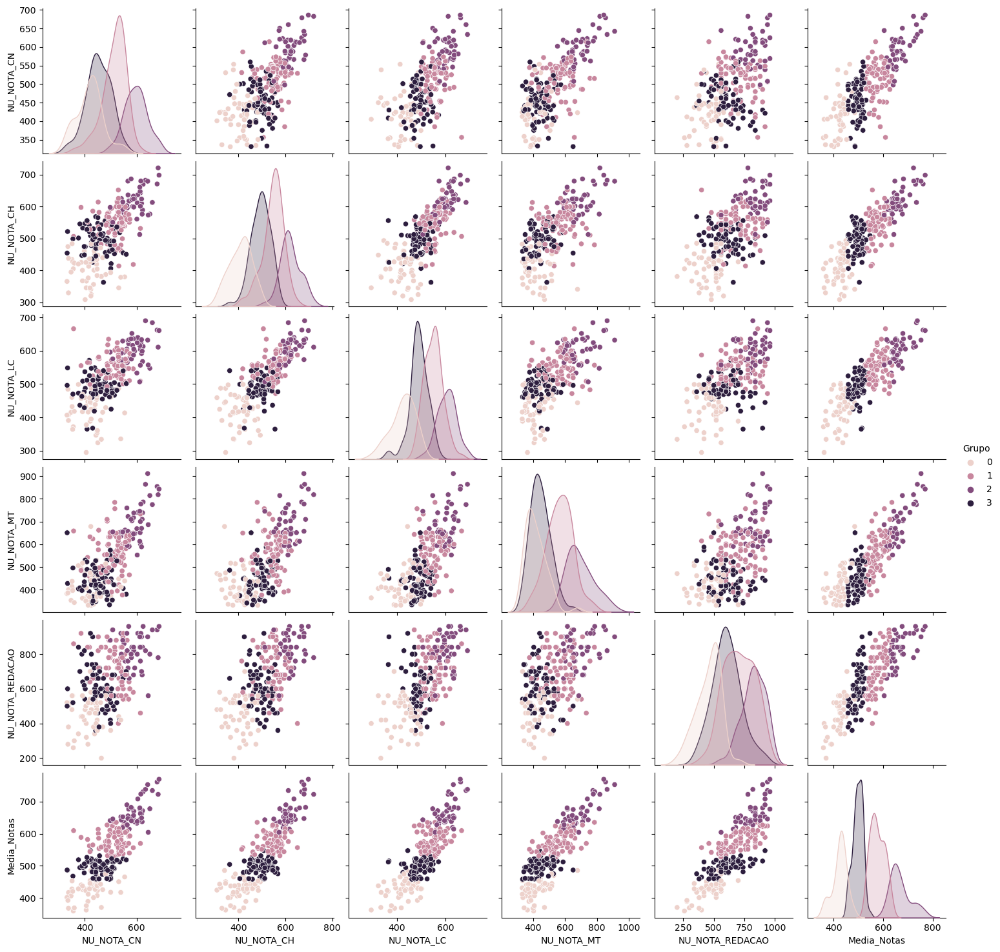

In [99]:
kmeans_k4 = KMeans(n_clusters = 4, init = 'k-means++', random_state = 5, max_iter = 300)
kmeans_k4.fit(amostra_f_escalonada)
agrupamento4 = pd.DataFrame(kmeans_k4.labels_, columns = ['Grupo'])
amostra_kmeans = pd.concat([amostra_f, agrupamento4],axis=1)

sns.pairplot(amostra_kmeans, hue = 'Grupo')
plt.show()


In [100]:
amostra_tipoEscola_Grupo4 = pd.concat([amostra["TP_ESCOLA"], agrupamento4],axis=1)

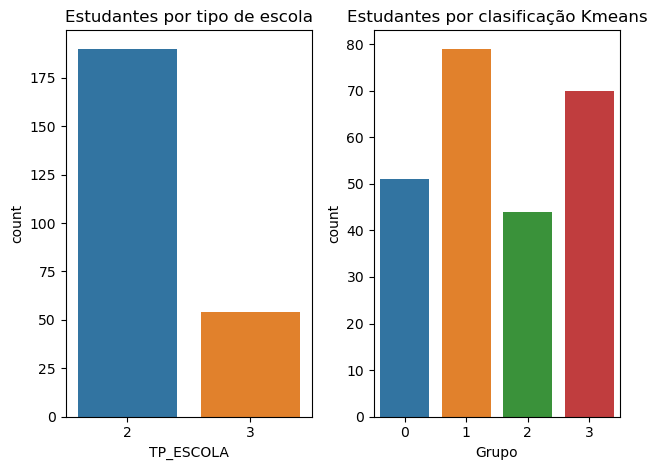

In [101]:
plt.subplot(1, 2, 1)
sns.countplot(x=amostra_tipoEscola_Grupo4['TP_ESCOLA'])
plt.title('Estudantes por tipo de escola')

plt.subplot(1, 2, 2)
sns.countplot(x=amostra_tipoEscola_Grupo4['Grupo'])
plt.title('Estudantes por clasificação Kmeans')

plt.tight_layout()
plt.show()

In [102]:
# Crear una tabla de contingencia
contingency_table = pd.crosstab(amostra_tipoEscola_Grupo4['TP_ESCOLA'], amostra_tipoEscola_Grupo4['Grupo'])

# Mostrar la tabla de contingencia
print(contingency_table)

Grupo       0   1   2   3
TP_ESCOLA                
2          51  63  15  61
3           0  16  29   9


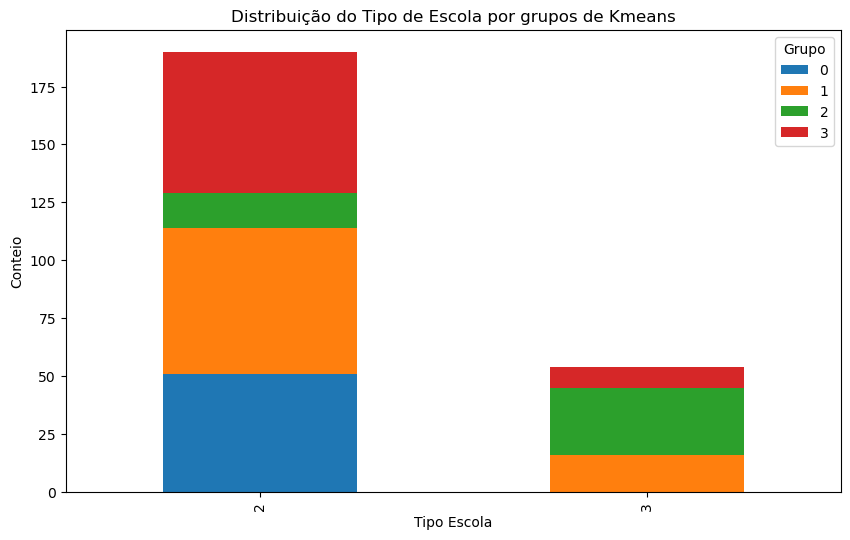

In [103]:
contingency_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição do Tipo de Escola por grupos de Kmeans')
plt.xlabel('Tipo Escola')
plt.ylabel('Conteio')
plt.legend(title='Grupo')
plt.show()

In [104]:
contingency_table2 = pd.crosstab(amostra_tipoEscola_Grupo4['Grupo'], amostra_tipoEscola_Grupo4['TP_ESCOLA'])

print(contingency_table2)

TP_ESCOLA   2   3
Grupo            
0          51   0
1          63  16
2          15  29
3          61   9


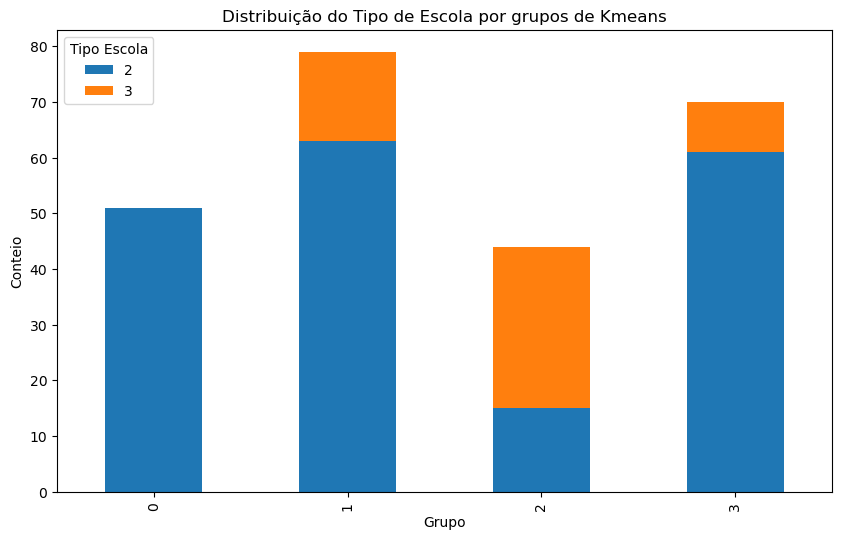

In [105]:
contingency_table2.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição do Tipo de Escola por grupos de Kmeans')
plt.xlabel('Grupo')
plt.ylabel('Conteio')
plt.legend(title='Tipo Escola')
plt.show()